# Project 2: Predicting Healthcare Costs

## Imports / Initializations

In [1]:
# Import Libraries and dependencies
# View and Analyze data
import numpy as np
import pandas as pd

# Matplotlib, Seaborn and Plotly for visualization
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import plot, iplot, init_notebook_mode

# Linear Regression using Scikit-learn
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import r2_score, mean_squared_error

# Remove Warning Messages
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Initializing plot parameters
sns.set_style('darkgrid')
plt.rcParams['font.size'] = 14
#plt.rcParams['figure.figsize'] = (20 ,1)
plt.rcParams['figure.facecolor'] = '#00000000'
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['mathtext.fontset'] = 'custom'
plt.rcParams['mathtext.bf'] = 'Arial:bold'
plt.rcParams['mathtext.it'] = 'Arial:italic'

## Data Review

### Initial Data - MEPS

In [3]:
# Importing CSV produced by data_cleaning into DataFrame
df_healthcare_raw = pd.read_csv("Resources/2018_FYC.csv")

# Renaming columns
df_healthcare_raw.columns = ['ID', 'Family_Size', 'Region', 'Year', 'Age', 'Sex', 'Race', 'Education_Level', 'Highest_Degree', 'BMI', 'Tobacco_Use', 'Total_Personal_Income', 'Uninsured_2018', 'Total_Expenditure', 'Exp_Pocket', 'Exp_Medicare', 'Total_Medicaid', 'Exp_VA', 'Total_Priv_Tri', 'Total_Other']

# Reviewing Dataframe
display(df_healthcare_raw.head())
display(df_healthcare_raw.describe())

,ID,Family_Size,Region,Year,Age,Sex,Race,Education_Level,Highest_Degree,BMI,Tobacco_Use,Total_Personal_Income,Uninsured_2018,Total_Expenditure,Exp_Pocket,Exp_Medicare,Total_Medicaid,Exp_VA,Total_Priv_Tri,Total_Other
0,2290001,2,2,2018,27,2,1,16,4,21.4,3,32000,2,2368,225,0,2037,0,107,0
1,2290001,2,2,2018,25,1,1,17,4,30.6,3,0,2,2040,136,0,0,0,1904,0
2,2290002,6,2,2018,34,2,1,10,3,28.2,3,25000,2,173,74,0,0,0,99,0
3,2290002,6,2,2018,39,1,1,10,3,28.7,3,30000,2,0,0,0,0,0,0,0
4,2290002,6,2,2018,11,1,1,4,8,-1.0,-1,0,2,103,69,0,0,0,34,0


,ID,Family_Size,Region,Year,Age,Sex,Race,Education_Level,Highest_Degree,BMI,Tobacco_Use,Total_Personal_Income,Uninsured_2018,Total_Expenditure,Exp_Pocket,Exp_Medicare,Total_Medicaid,Exp_VA,Total_Priv_Tri,Total_Other
count,3.046100e+04,30461.000000,30461.000000,30461.0,30461.000000,30461.000000,30461.000000,30461.000000,30461.000000,30461.000000,30461.000000,30461.000000,30461.000000,30461.000000,30461.000000,30461.000000,30461.000000,30461.000000,30461.000000,30461.000000
mean,2.310116e+06,3.258921,2.709202,2018.0,38.860182,1.520896,1.960966,10.371196,4.374577,15.863012,1.092643,28969.200814,1.923148,6093.899183,732.505630,1795.117462,937.317258,181.333738,2223.988510,198.529497
std,1.527838e+04,1.767260,1.040829,0.0,23.855768,0.499571,2.574769,5.754640,2.658909,16.411995,2.734621,38907.704727,0.266361,17531.604384,2732.159668,8633.759882,7019.146572,2714.301681,11299.067341,2506.141940
min,2.290001e+06,-1.000000,-1.000000,2018.0,-1.000000,1.000000,1.000000,-15.000000,-15.000000,-15.000000,-15.000000,-309948.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.294946e+06,2.000000,2.000000,2018.0,17.000000,1.000000,1.000000,8.000000,3.000000,-1.000000,-1.000000,0.000000,2.000000,213.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2.320170e+06,3.000000,3.000000,2018.0,38.000000,2.000000,1.000000,12.000000,4.000000,22.300000,3.000000,16000.000000,2.000000,1179.000000,116.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2.325003e+06,4.000000,3.000000,2018.0,59.000000,2.000000,2.000000,14.000000,7.000000,28.500000,3.000000,42000.000000,2.000000,4903.000000,619.000000,0.000000,0.000000,0.000000,1019.000000,0.000000
max,2.329687e+06,16.000000,4.000000,2018.0,85.000000,2.000000,12.000000,17.000000,8.000000,71.100000,3.000000,318505.000000,2.000000,807611.000000,221100.000000,236672.000000,370704.000000,202281.000000,790087.000000,219316.000000


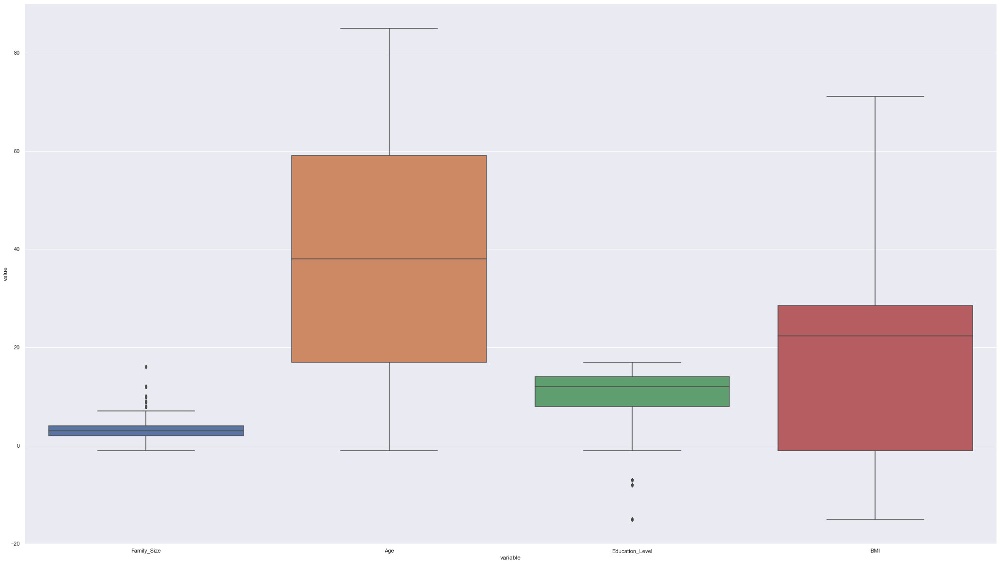

In [4]:
# Plotting all non-categorical columns
sns.set(rc={'figure.figsize':(35,20)})
plot_noncat_raw = sns.boxplot(x="variable", y="value", data=pd.melt(df_healthcare_raw[['Family_Size', 'Age', 'Education_Level', 'BMI']]))

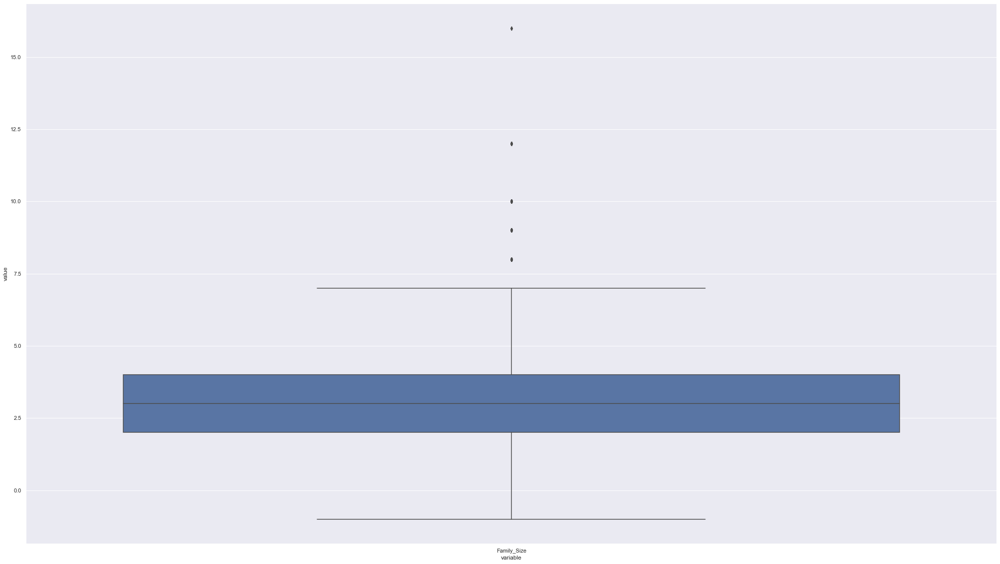

In [5]:
plot_noncat_raw = sns.boxplot(x="variable", y="value", data=pd.melt(df_healthcare_raw[['Family_Size']]))

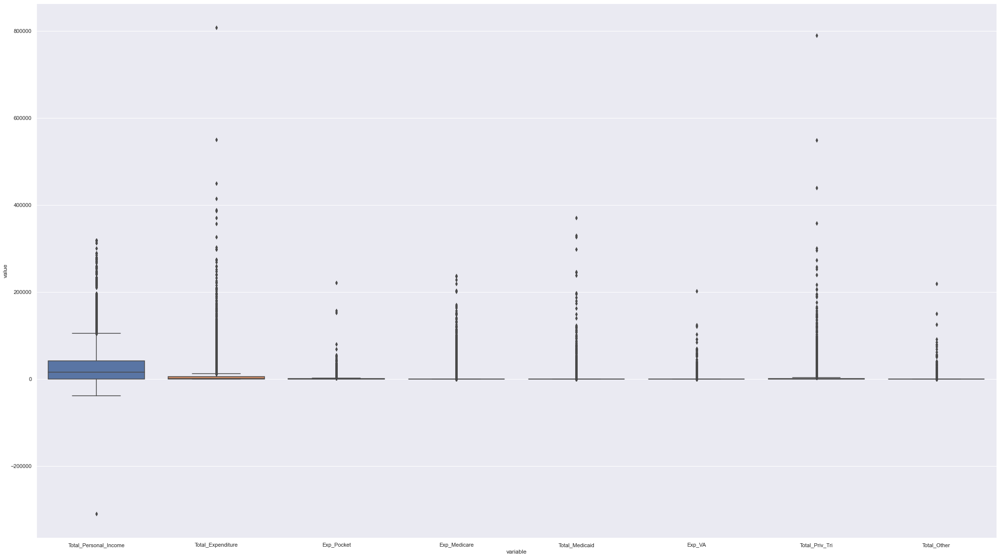

In [6]:
# Visualizing all non-binary columns 
plot_exp_raw = sns.boxplot(x="variable", y="value", data=pd.melt(df_healthcare_raw[['Total_Personal_Income', 'Total_Expenditure', 'Exp_Pocket', 'Exp_Medicare', 'Total_Medicaid', 'Exp_VA', 'Total_Priv_Tri', 'Total_Other']]))

### Data Analysis: Glaring issues
Non-categorical: 
* Negative values that should not exist (encoding)
* Many outliers

Financial:
* Large outliers
* Non-relevant negatives (also outliers)

In [7]:
# Data Cleaning
### NEED TO GET RID OF YEAR & HIGHEST DEGREE
df_healthcare_raw.drop('Year', axis=1, inplace=True)
#df_healthcare.drop('Highest_Degree', axis=1, inplace=True)

# Filtering only for insured customers (insured=2)
df_healthcare = df_healthcare_raw.loc[(df_healthcare_raw['Uninsured_2018'] == 2)]
# Removing now nonrelevant column
df_healthcare.drop('Uninsured_2018', axis=1, inplace=True)

# Filtering data to just the adults
df_healthcare = df_healthcare.loc[(df_healthcare['Age'] >= 20)]

# Filtering for applicable tobacco answers (1=Every day, 2=Somedays, 3=No)
df_healthcare = df_healthcare.loc[(df_healthcare['Tobacco_Use'] > 0)]

# Filtering out NA 
df_healthcare = df_healthcare[(df_healthcare['Education_Level'] >= 0)]
#df_healthcare = df_healthcare[(df_healthcare['BMI'] > 0)]


# Quartile Adjustments
# Filtering for all valid family sizes below the upper range (3rd quartile)
normalize = ['Age', 'Total_Expenditure','Family_Size', 'BMI']

for feature in normalize:
    # Removing NA 
    df_healthcare = df_healthcare[(df_healthcare[feature] > 0)]
    
    # Calculating 
    q1 = df_healthcare[feature].quantile(.25)
    q3 = df_healthcare[feature].quantile(.75)
    IQR = q3 - q1
    lower = q1 - 1.5 * IQR
    upper = q3 + 1.5 * IQR
    
    if feature =='BMI':
        df_healthcare = df_healthcare[df_healthcare[feature].between(lower, upper)]
    
    else: # Removing all above upper range
        df_healthcare = df_healthcare[df_healthcare[feature] < upper]


#for feature in normalize:
#    q3 = df_healthcare[feature].quantile(.75)
#    df_healthcare = df_healthcare[df_healthcare[feature].between(0, q3)]
#    df_healthcare = df_healthcare.loc[(df_healthcare[feature].between(0, q3)]
    
#q3_totexp = df_healthcare['Family_Size'].quantile(.75)
#df_healthcare = df_healthcare.loc[(df_healthcare['Total_Expenditure'] <= q3_totexp)]
#df_healthcare = df_healthcare.loc[(df_healthcare['Family_Size'] > 0)]

# Filtering for all valid BMI 
#df_healthcare = df_healthcare.loc[(df_healthcare['BMI'] > 5)]

# Filtering for Total_Expenditure outliers
#q3_totexp = df_healthcare['Total_Expenditure'].quantile(.75)
#df_healthcare = df_healthcare.loc[(df_healthcare['Total_Expenditure'] <= q3_totexp)]

# Setting index to unique identifier number
df_healthcare = df_healthcare.set_index('ID')

# Reviewing Dataframe
df_healthcare.head(10)

,Family_Size,Region,Age,Sex,Race,Education_Level,Highest_Degree,BMI,Tobacco_Use,Total_Personal_Income,Total_Expenditure,Exp_Pocket,Exp_Medicare,Total_Medicaid,Exp_VA,Total_Priv_Tri,Total_Other
ID,,,,,,,,,,,,,,,,,
2290001,2,2,27,2,1,16,4,21.4,3,32000,2368,225,0,2037,0,107,0
2290001,2,2,25,1,1,17,4,30.6,3,0,2040,136,0,0,0,1904,0
2290002,6,2,34,2,1,10,3,28.2,3,25000,173,74,0,0,0,99,0
2290003,4,2,36,2,1,17,5,21.5,3,30217,535,232,0,0,0,303,0
2290005,5,2,30,1,1,14,3,28.3,3,31644,800,140,0,0,0,660,0
2290005,5,2,32,2,1,12,2,28.9,3,29244,5233,1550,0,0,0,3683,0
2290007,2,3,60,1,1,11,1,21.9,3,5000,519,1,0,0,0,518,0
2290007,2,3,54,2,1,12,3,27.6,3,41750,3058,283,0,0,0,2775,0
2290008,4,2,35,1,1,14,7,27.2,3,69843,1345,321,0,0,0,1024,0


In [8]:
# Reviewing statistical summary of our dataset
df_healthcare.describe()

,Family_Size,Region,Age,Sex,Race,Education_Level,Highest_Degree,BMI,Tobacco_Use,Total_Personal_Income,Total_Expenditure,Exp_Pocket,Exp_Medicare,Total_Medicaid,Exp_VA,Total_Priv_Tri,Total_Other
count,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000
mean,2.559252,2.696127,52.215492,1.549239,1.805776,13.658143,3.652267,27.988183,2.701092,44708.554535,4341.250248,837.287984,1148.569017,460.148626,119.670391,1640.618504,108.396226
std,1.317086,1.019636,17.624456,0.497590,2.323985,2.710978,1.629276,5.694775,0.668162,43402.254148,4808.206728,1456.163270,2824.764090,1934.539460,874.994701,2987.353329,659.567787
min,1.000000,1.000000,20.000000,1.000000,1.000000,0.000000,-8.000000,11.500000,1.000000,-38378.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,2.000000,37.000000,1.000000,1.000000,12.000000,3.000000,23.800000,3.000000,15000.000000,838.000000,77.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2.000000,3.000000,53.000000,2.000000,1.000000,14.000000,3.000000,27.300000,3.000000,33059.500000,2419.000000,347.000000,0.000000,0.000000,0.000000,398.000000,0.000000
75%,3.000000,4.000000,67.000000,2.000000,1.000000,16.000000,4.000000,31.500000,3.000000,60323.750000,6195.000000,965.250000,590.000000,0.000000,0.000000,1786.000000,0.000000
max,6.000000,4.000000,85.000000,2.000000,12.000000,17.000000,7.000000,44.100000,3.000000,318505.000000,21026.000000,20559.000000,19928.000000,21013.000000,18701.000000,20689.000000,18012.000000


In [9]:
# Examining Dataframe values & columns
df_healthcare.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12084 entries, 2290001 to 2329687
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Family_Size            12084 non-null  int64  
 1   Region                 12084 non-null  int64  
 2   Age                    12084 non-null  int64  
 3   Sex                    12084 non-null  int64  
 4   Race                   12084 non-null  int64  
 5   Education_Level        12084 non-null  int64  
 6   Highest_Degree         12084 non-null  int64  
 7   BMI                    12084 non-null  float64
 8   Tobacco_Use            12084 non-null  int64  
 9   Total_Personal_Income  12084 non-null  int64  
 10  Total_Expenditure      12084 non-null  int64  
 11  Exp_Pocket             12084 non-null  int64  
 12  Exp_Medicare           12084 non-null  int64  
 13  Total_Medicaid         12084 non-null  int64  
 14  Exp_VA                 12084 non-null  int64  

In [10]:
# Checking for null values in our data
df_healthcare.isnull().sum()

Family_Size              0
Region                   0
Age                      0
Sex                      0
Race                     0
Education_Level          0
Highest_Degree           0
BMI                      0
Tobacco_Use              0
Total_Personal_Income    0
Total_Expenditure        0
Exp_Pocket               0
Exp_Medicare             0
Total_Medicaid           0
Exp_VA                   0
Total_Priv_Tri           0
Total_Other              0
dtype: int64

## CHECKING DISTRIBUTION OF VARIABLES

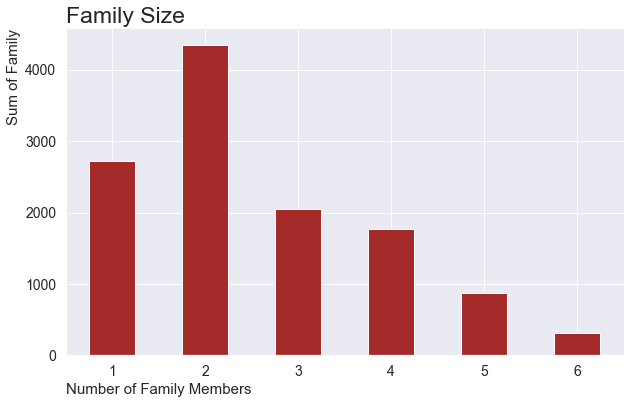

In [11]:
# Distribution of children
# Plotting children counts using bar plot
df_healthcare.Family_Size.value_counts().sort_index().plot(kind = 'bar', figsize = (10, 6), color = "brown")

# Adjusting plot parameters
plt.title('Family Size', fontdict = {'fontsize': 23}, loc = 'left')
plt.xticks(rotation = 0, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel('Number of Family Members', fontsize = 15, loc = 'left')
plt.ylabel('Sum of Family', fontsize = 15, loc = 'top')
sns.despine()
plt.show()

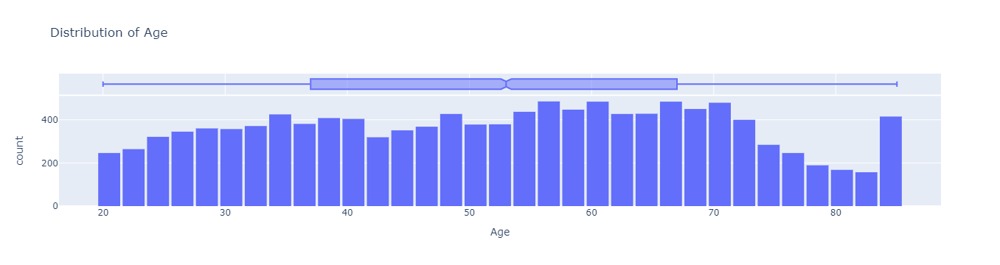

In [12]:
#Lets look at age distribution in our dataset
fig = px.histogram(df_healthcare, 
                   x='Age', 
                   marginal='box',
                   nbins=47,
                   title='Distribution of Age')
fig.update_layout(bargap=0.1)

# Displaying plot
fig.show()

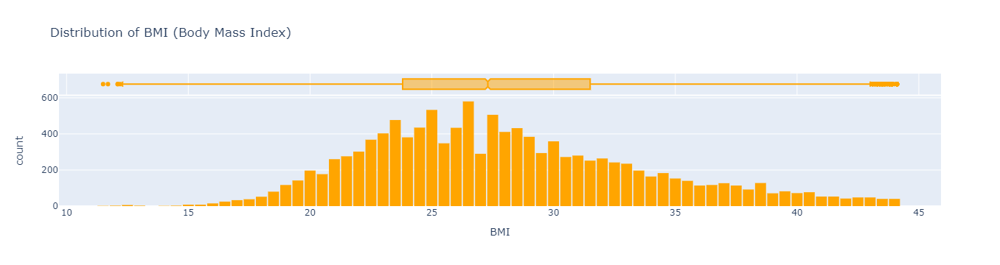

In [13]:
# Lets look at BMI distribution in dataset. Normal BMI is in the range 18.5 to 24.9.
fig = px.histogram(df_healthcare, 
                   x='BMI', 
                   marginal='box', 
                   color_discrete_sequence=['orange'], 
                   title='Distribution of BMI (Body Mass Index)')
fig.update_layout(bargap=0.1)
fig.show()

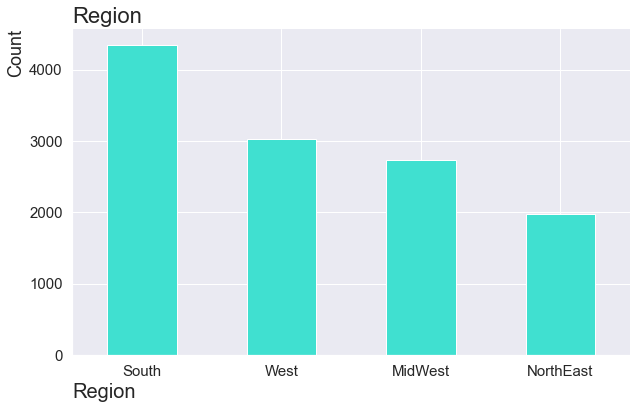

In [14]:
# Distribution of regions
df_healthcare.Region.value_counts().plot(kind = 'bar', figsize = (10, 6), color = "turquoise")
# x.legend(labels=regions)
plt.title('Region', fontdict = {'fontsize': 22, 'fontweight': 'medium'}, loc = 'left')
plt.xticks(rotation = 0, fontsize = 15)
plt.xticks(np.arange(4), ('South', 'West', 'MidWest', 'NorthEast'))
plt.yticks(fontsize = 15)
plt.xlabel('Region', fontsize = 20, loc = 'left')
plt.ylabel('Count', fontsize = 18, loc = 'top')
sns.despine()
plt.show()

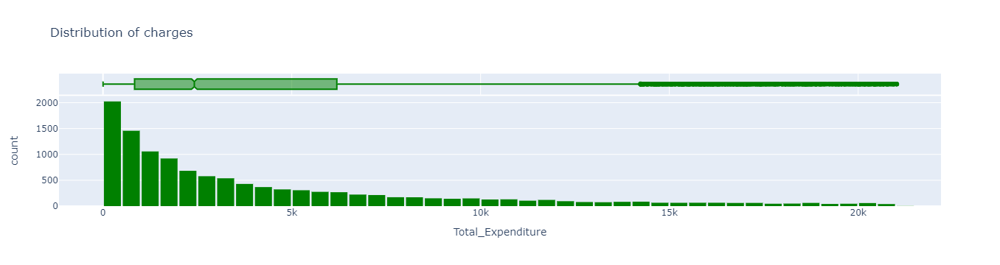

In [15]:
# Lets look at Total_Expenditure(Charges) distribution in dataset
fig = px.histogram(df_healthcare, 
                   x='Total_Expenditure', 
                   marginal='box', 
                   color_discrete_sequence=['green'], 
                   title='Distribution of charges')
fig.update_layout(bargap=0.1)
fig.show()

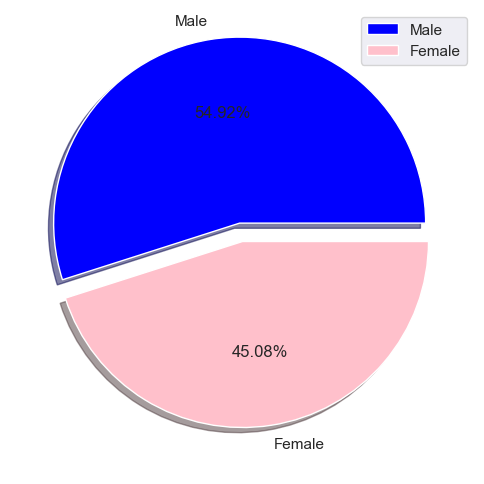

In [16]:
# Gender Proportion
count = df_healthcare.Sex.value_counts()
count

# Creating Pie Chart piechart
labels = ['Male', 'Female']
explode = [0.1, 0]
colors = ['blue', 'pink']

plt.figure(figsize= (6,9), dpi =100,facecolor='white')
plt.pie(count, explode=[0.1, 0], labels= labels, colors= colors, autopct='%0.02f%%', shadow=True)
plt.legend()


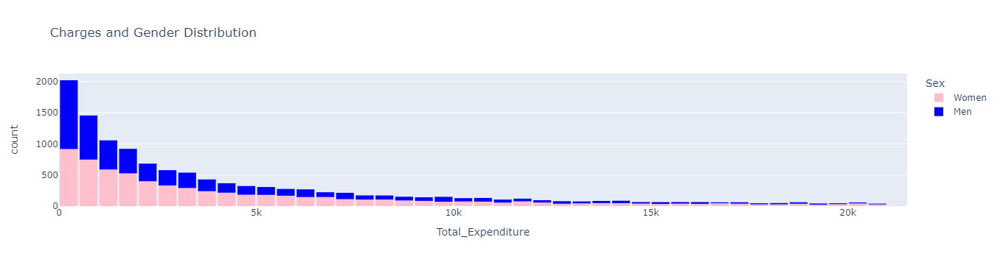

In [17]:
# Looking at distribution of charges by gender
fig = px.histogram(df_healthcare,
                   x = 'Total_Expenditure',
                   color = 'Sex',
                   color_discrete_sequence = ["pink","blue"],
                   title = 'Charges and Gender Distribution'
)
newnames = {'1':'Men', '2': 'Women'}
fig.for_each_trace(lambda t: t.update(name = newnames[t.name],
                                      legendgroup = newnames[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, newnames[t.name])
                                     )
                  )
fig.update_layout(bargap=0.1)
fig.show()

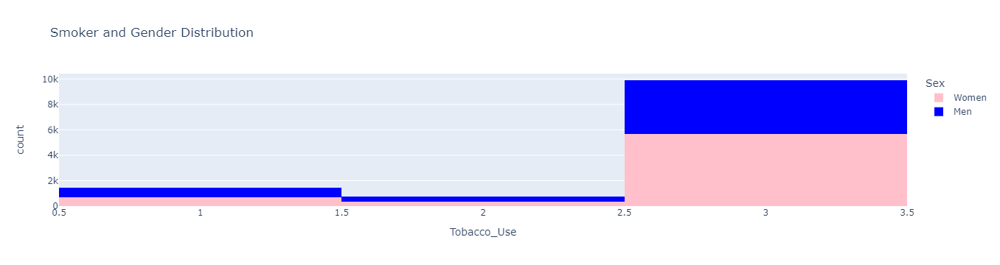

In [18]:
# Distribution of smokers and gender
fig_tbc_sex = px.histogram(df_healthcare, x='Tobacco_Use', color='Sex', color_discrete_sequence=["pink","blue"], title='Smoker and Gender Distribution')
newnames = {'1':'Men', '2': 'Women'}
fig_tbc_sex.for_each_trace(lambda t: t.update(name = newnames[t.name],
                                      legendgroup = newnames[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, newnames[t.name])
                                     )
                  )
fig.update_layout(bargap=0.1)
fig_tbc_sex.show()

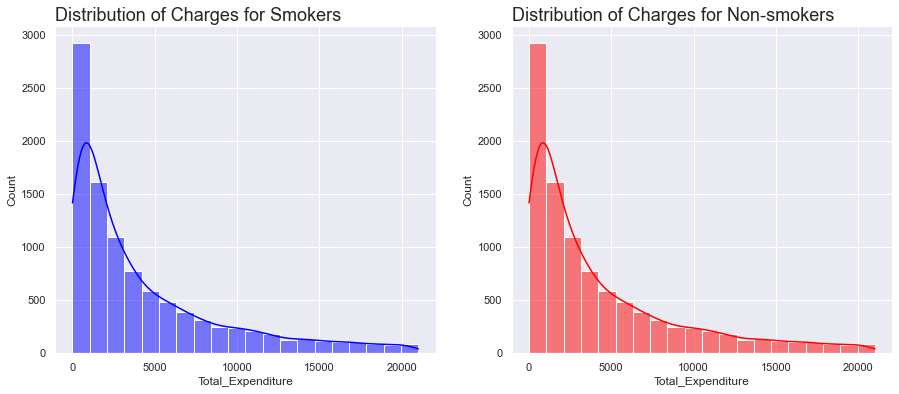

In [19]:
# Distribution of charges for smokers
# Creating plot
fig = plt.figure(figsize = (15, 6))

# Adding subplot
ax = fig.add_subplot(121)
sns.histplot(df_healthcare[(df_healthcare.Tobacco_Use == 1|2)]['Total_Expenditure'], color = "blue", ax = ax, kde = True, bins = 20)
ax.set_title('Distribution of Charges for Smokers', fontdict = {'fontsize': 18}, loc = 'left')

ax = fig.add_subplot(122)
sns.histplot(df_healthcare[(df_healthcare.Tobacco_Use == 3)]['Total_Expenditure'], color = "red", ax = ax, kde = True, bins = 20)
ax.set_title('Distribution of Charges for Non-smokers', fontdict = {'fontsize': 18}, loc = 'left')

sns.despine()

# Displaying plot
plt.show()

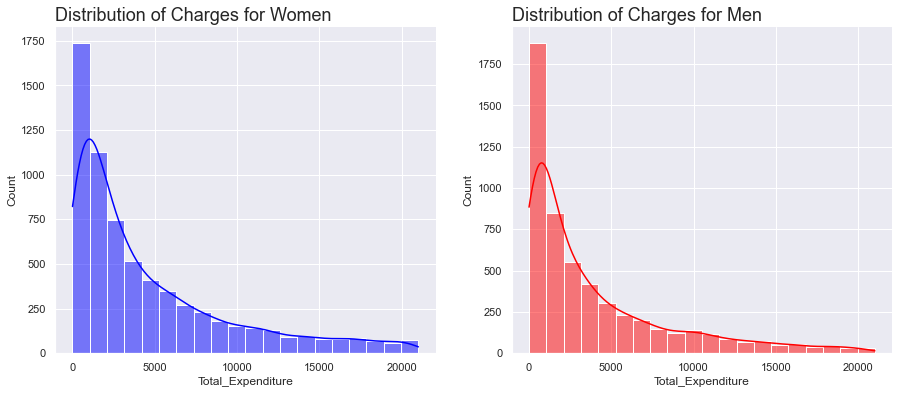

In [20]:
# Distribution of charges for gender
# Creating Plot
fig = plt.figure(figsize = (15, 6))

# Adding subplot
ax = fig.add_subplot(121)
sns.histplot(df_healthcare[(df_healthcare.Sex == 2)]['Total_Expenditure'], color = "blue", ax = ax, kde = True, bins = 20)
ax.set_title('Distribution of Charges for Women', fontdict = {'fontsize': 18}, loc = 'left')

ax = fig.add_subplot(122)
sns.histplot(df_healthcare[(df_healthcare.Sex == 1)]['Total_Expenditure'], color = "red", ax = ax, kde = True, bins = 20)
ax.set_title('Distribution of Charges for Men', fontdict = {'fontsize': 18}, loc = 'left')

sns.despine()

# Displaying plot
plt.show()

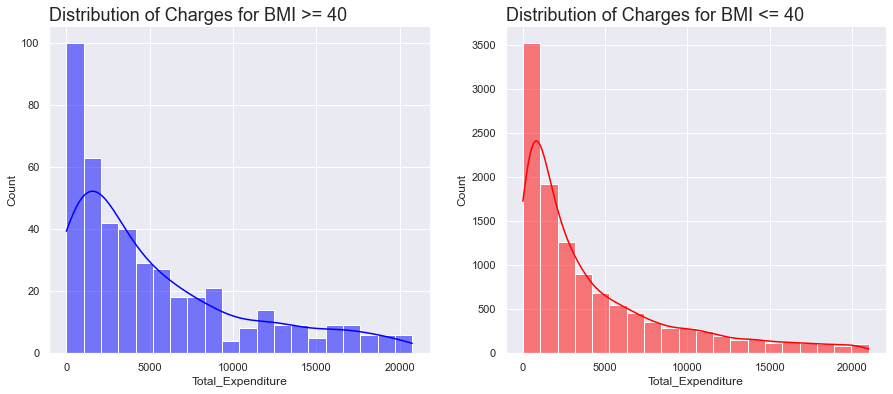

In [21]:
# Distribution of charges for bmi

fig = plt.figure(figsize = (15, 6))

ax = fig.add_subplot(121)
sns.histplot(df_healthcare[(df_healthcare.BMI >= 40)]['Total_Expenditure'], color ="blue", ax = ax, kde = True, bins = 20)
ax.set_title('Distribution of Charges for BMI >= 40', fontdict = {'fontsize': 18}, loc = 'left')

ax = fig.add_subplot(122)
sns.histplot(df_healthcare[(df_healthcare.BMI <= 40)]['Total_Expenditure'], color = "red", ax = ax, kde = True, bins = 20)
ax.set_title('Distribution of Charges for BMI <= 40', fontdict = {'fontsize': 18}, loc = 'left')

sns.despine()

plt.show()

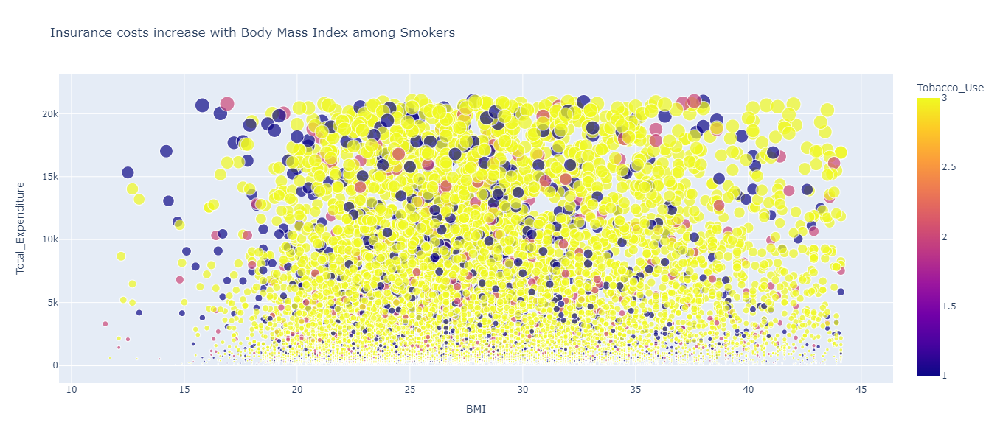

In [22]:
# Distribution of charges for bmi for smoker and non smokers
fig = px.scatter(df_healthcare, x='BMI', y='Total_Expenditure', color='Tobacco_Use', size='Total_Expenditure',
                 title="Insurance costs increase with Body Mass Index among Smokers",
                 color_discrete_sequence=['#B14B51','#B7A294'],height=600)
fig.show()

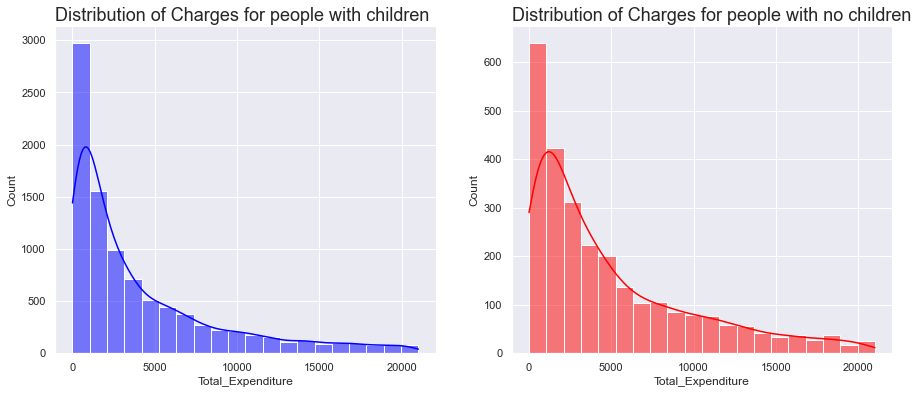

In [23]:
# Distribution of charges for children

fig = plt.figure(figsize = (15, 6))

ax = fig.add_subplot(121)
sns.histplot(df_healthcare[(df_healthcare.Family_Size > 1)]['Total_Expenditure'], color = "blue", ax = ax, kde = True, bins = 20)
ax.set_title('Distribution of Charges for people with children', fontdict = {'fontsize': 18}, loc = 'left')

ax = fig.add_subplot(122)
sns.histplot(df_healthcare[(df_healthcare.Family_Size == 1)]['Total_Expenditure'], color = "red", ax = ax, kde = True, bins = 20)
ax.set_title('Distribution of Charges for people with no children', fontdict = {'fontsize': 18}, loc = 'left')

sns.despine()

plt.show()

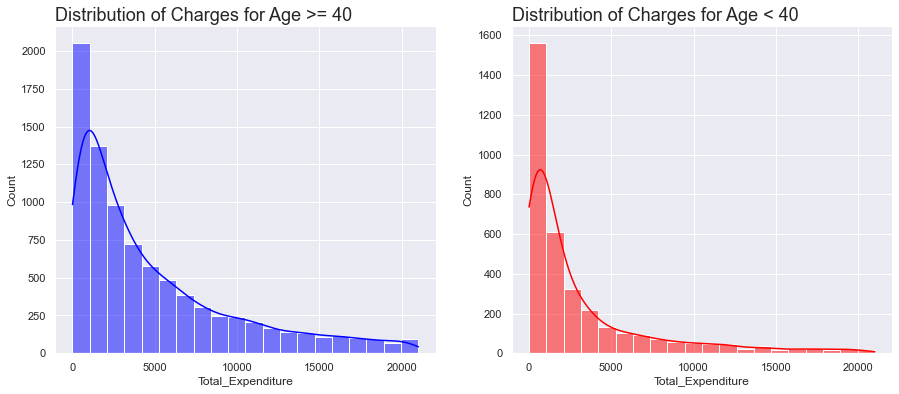

In [24]:
# Distribution of charges for smokers

fig = plt.figure(figsize = (15, 6))

ax = fig.add_subplot(121)
sns.histplot(df_healthcare[(df_healthcare.Age >= 40)]['Total_Expenditure'], color = "blue", ax = ax, kde = True, bins = 20)
ax.set_title('Distribution of Charges for Age >= 40', fontdict = {'fontsize': 18}, loc = 'left')

ax = fig.add_subplot(122)
sns.histplot(df_healthcare[(df_healthcare.Age < 40)]['Total_Expenditure'], color = "red", ax = ax, kde = True, bins = 20)
ax.set_title('Distribution of Charges for Age < 40', fontdict = {'fontsize': 18}, loc = 'left')

sns.despine()

plt.show()

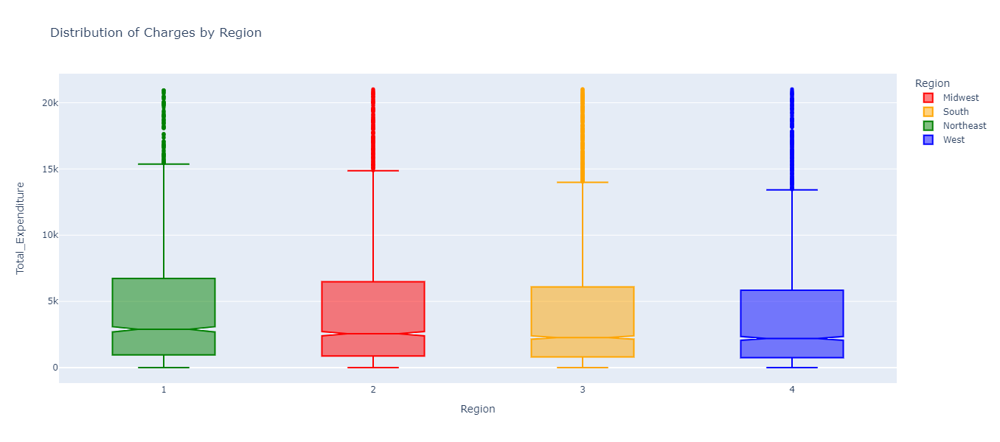

In [25]:
# looking at distribution of charges accross regions
fig = px.box(df_healthcare, x="Region", y="Total_Expenditure", color="Region", 
             notched=True, points="outliers", height=600,
             title="Distribution of Charges by Region",
             color_discrete_sequence=['red', 'orange', 'green', 'blue'])
fig.update_traces(marker_size=5)
newnames = {'1': 'Northeast', '2': 'Midwest', '3':'South', '4':'West'}
fig.for_each_trace(lambda t: t.update(name = newnames[t.name],
                                      legendgroup = newnames[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, newnames[t.name])
                                     )
                  )
fig.show()


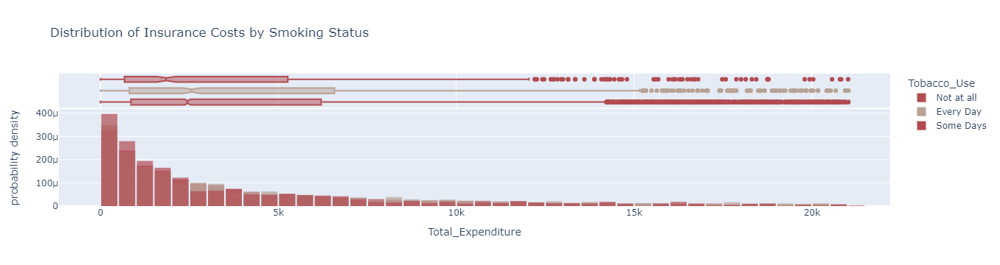

In [26]:
# Distribution of charges by smoking status
fig=px.histogram(df_healthcare, x='Total_Expenditure', color='Tobacco_Use', opacity=0.7, barmode='overlay',
                 histnorm='probability density', marginal='box', 
                 title="Distribution of Insurance Costs by Smoking Status",
                 color_discrete_sequence=['#B14B51','#B7A294']) 
fig.update_layout(bargap=0.1)
newnames = {'1': 'Every Day', '2': 'Some Days', '3':'Not at all'}
fig.for_each_trace(lambda t: t.update(name = newnames[t.name],
                                      legendgroup = newnames[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, newnames[t.name])
                                     )
                  )
fig.show()

In [27]:
# add color array to set_palette 
# function of seaborn
#create your own color array
my_colors = ["violet", "purple", "magenta"]
sns.set_palette(my_colors)

<AxesSubplot:title={'center':'Charges vs Region vs Smoker'}, xlabel='Region', ylabel='Total_Expenditure'>

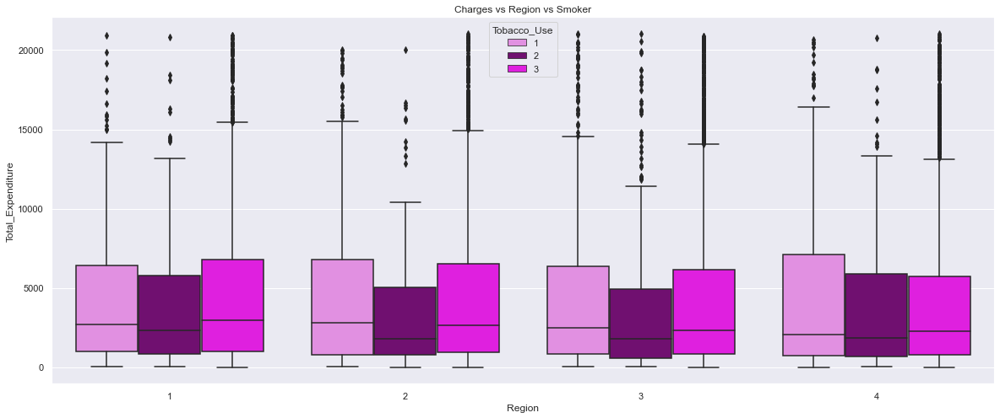

In [28]:
plt.subplots(1,1,figsize=(20,8))
plt.title('Charges vs Region vs Smoker')
sns.boxplot(x='Region', y='Total_Expenditure', hue='Tobacco_Use', data=df_healthcare, palette=my_colors)

# Visualizations

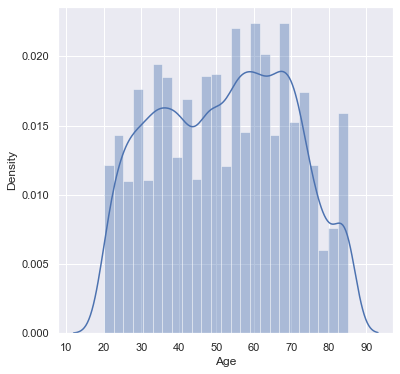

In [29]:
#distribution of age value column(what age group predominant in our data)
sns.set()
plt.figure(figsize=(6,6))
sns.distplot(df_healthcare["Age"])
plt.show()
#this density plot shows us that we have more sample of group beloning to age 22, 31, 42, 55, 65, 85

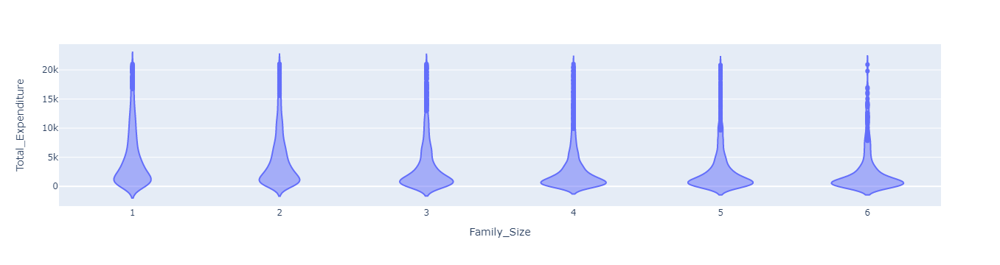

In [30]:
px.violin(df_healthcare[(df_healthcare.Family_Size <=10)], x='Family_Size', y='Total_Expenditure')# here we can see not there is not a lot of coorelation between #of children and amoumt of charge

In [31]:
df_healthcare["Family_Size"].value_counts()#3751 samples out of data have 1 child

2    4353
1    2718
3    2049
4    1776
5     877
6     311
Name: Family_Size, dtype: int64

<AxesSubplot:xlabel='Sex', ylabel='Total_Expenditure'>

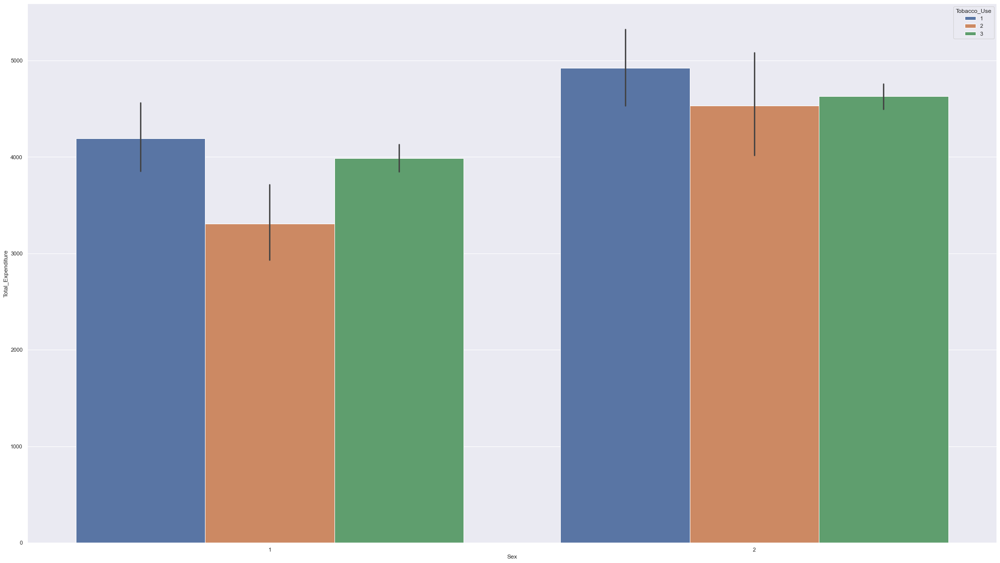

In [32]:
sns.barplot(data = df_healthcare,x = 'Sex',y = 'Total_Expenditure', hue = "Tobacco_Use")

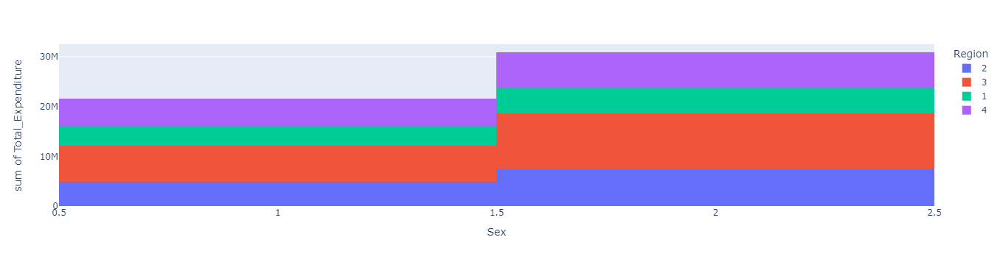

In [33]:
px.histogram(df_healthcare,x='Sex',y = 'Total_Expenditure', color = 'Region')

# Correlation

As you can tell from the analysis, the values in some columns are more closely related to the values in "charges" compared to other columns. E.g. "age" and "charges" seem to grow together, whereas "bmi" and "charges" don't.

This relationship is often expressed numerically using a measure called the correlation coefficient, which can be computed using the .corr method of a Pandas series.

In [34]:
df_healthcare.Total_Expenditure.corr(df_healthcare.Age)

0.26548674116774174

In [35]:
df_healthcare.Total_Expenditure.corr(df_healthcare.BMI)

0.08235553063608349

In [36]:
df_healthcare.Family_Size.corr(df_healthcare.Total_Expenditure)

-0.1387659774282788

In [37]:
df_healthcare.corr()

,Family_Size,Region,Age,Sex,Race,Education_Level,Highest_Degree,BMI,Tobacco_Use,Total_Personal_Income,Total_Expenditure,Exp_Pocket,Exp_Medicare,Total_Medicaid,Exp_VA,Total_Priv_Tri,Total_Other
Family_Size,1.000000,0.035409,-0.351814,0.022635,0.037004,-0.003100,-0.004860,0.027205,0.032541,-0.009523,-0.138766,-0.111294,-0.201837,0.025105,-0.030337,0.026270,-0.056937
Region,0.035409,1.000000,0.001111,0.011713,0.082174,-0.029141,-0.021565,-0.043004,0.036858,-0.005274,-0.038110,-0.013283,-0.009574,-0.022196,0.001657,-0.030764,-0.002517
Age,-0.351814,0.001111,1.000000,-0.023585,-0.069795,-0.127671,-0.072793,-0.008021,0.065109,-0.005639,0.265487,0.168793,0.440725,-0.075236,0.076750,-0.064509,0.098733
Sex,0.022635,0.011713,-0.023585,1.000000,0.017181,-0.007675,0.007136,-0.018846,0.080864,-0.180232,0.071828,0.028081,0.030202,0.089065,-0.100989,0.045507,0.002212
Race,0.037004,0.082174,-0.069795,0.017181,1.000000,-0.005141,-0.027936,-0.035381,0.005301,-0.035073,-0.038708,-0.056758,-0.035856,0.032823,-0.018915,-0.018639,0.009961
Education_Level,-0.003100,-0.029141,-0.127671,-0.007675,-0.005141,1.000000,0.622815,-0.103112,0.162665,0.376963,-0.021355,0.123108,-0.127388,-0.147956,-0.007982,0.127032,-0.009627
Highest_Degree,-0.004860,-0.021565,-0.072793,0.007136,-0.027936,0.622815,1.000000,-0.046929,0.140795,0.275081,-0.002400,0.085778,-0.083246,-0.108071,0.001536,0.106366,-0.017928
BMI,0.027205,-0.043004,-0.008021,-0.018846,-0.035381,-0.103112,-0.046929,1.000000,0.025585,-0.039409,0.082356,-0.004069,0.015057,0.060542,0.008212,0.072850,0.009384
Tobacco_Use,0.032541,0.036858,0.065109,0.080864,0.005301,0.162665,0.140795,0.025585,1.000000,0.120124,-0.004352,0.060940,0.014504,-0.115374,-0.024640,0.032835,0.001287
Total_Personal_Income,-0.009523,-0.005274,-0.005639,-0.180232,-0.035073,0.376963,0.275081,-0.039409,0.120124,1.000000,-0.026635,0.117758,-0.118759,-0.176454,-0.018703,0.136285,-0.033091


Here's how correlation coefficients can be interpreted

Strength: The greater the absolute value of the correlation coefficient, the stronger the relationship.

The extreme values of -1 and 1 indicate a perfectly linear relationship where a change in one variable is accompanied by a perfectly consistent change in the other. For these relationships, all of the data points fall on a line. In practice, you won’t see either type of perfect relationship.

A coefficient of zero represents no linear relationship. As one variable increases, there is no tendency in the other variable to either increase or decrease.

When the value is in-between 0 and +1/-1, there is a relationship, but the points don’t all fall on a line. As r approaches -1 or 1, the strength of the relationship increases and the data points tend to fall closer to a line.

Direction: The sign of the correlation coefficient represents the direction of the relationship.

Positive coefficients indicate that when the value of one variable increases, the value of the other variable also tends to increase. Positive relationships produce an upward slope on a scatterplot.

Negative coefficients represent cases when the value of one variable increases, the value of the other variable tends to decrease. Negative relationships produce a downward slope.

Pandas dataframes also provide a .corr method to compute the correlation coefficients between all pairs of numeric columns.

In [38]:
corr_healthcare_df = df_healthcare.drop(columns=[
    "Race", "Total_Other", "Exp_VA", "Total_Medicaid", 
    "Exp_Medicare", "Total_Priv_Tri", "Exp_Pocket", 
    "Total_Personal_Income", "Highest_Degree", "Education_Level"], 
                                        axis=1
                                       )

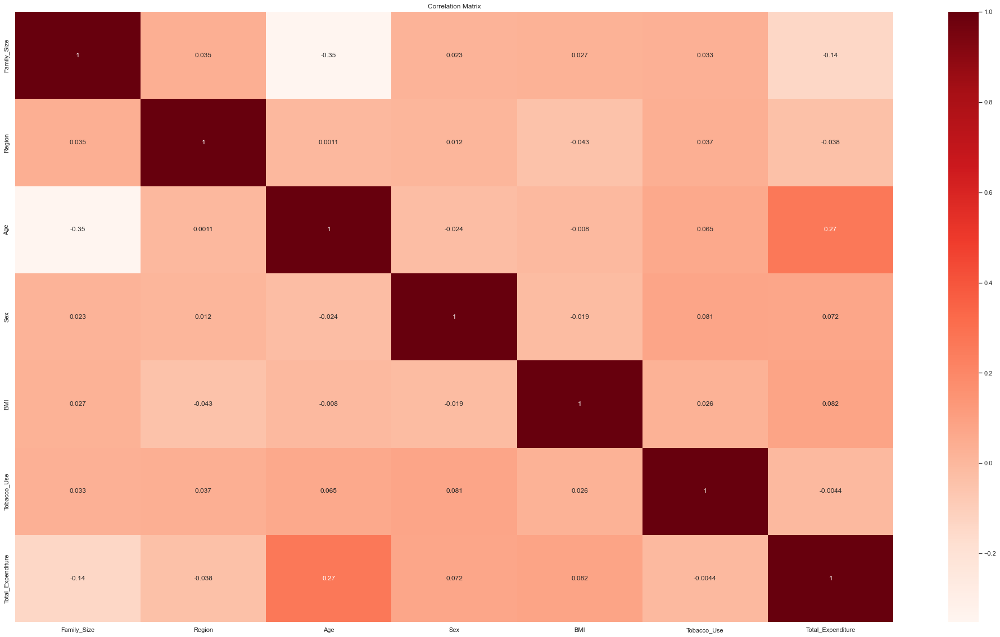

In [39]:
sns.heatmap(corr_healthcare_df.corr(), cmap='Reds', annot=True)
plt.title('Correlation Matrix');

In [40]:
corr2_healthcare_df = df_healthcare.drop(columns=["Family_Size", "BMI", "Age","Race", "Sex", 
                                                  "Tobacco_Use", "Region", "Total_Other", "Exp_VA", "Total_Medicaid", 
                                                    "Exp_Medicare", "Total_Priv_Tri", "Exp_Pocket", ])

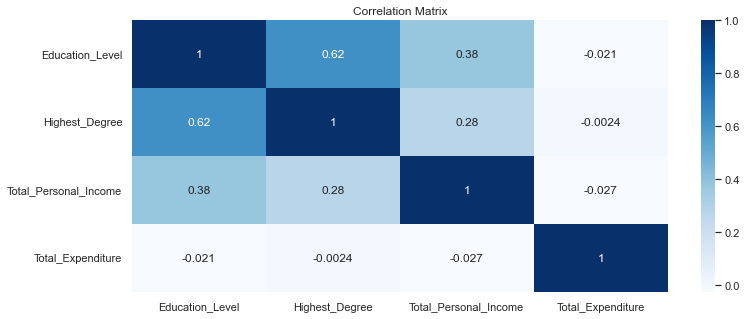

In [41]:
plt.subplots(figsize=(12, 5))
sns.heatmap(corr2_healthcare_df.corr(), cmap='Blues', annot=True)
plt.title('Correlation Matrix');

## Linear Regression using Scikit-learn for Non Smokers

Let's try to find a way of estimating the value of "charges" using the value of "age" for non-smokers. First, let's create a data frame containing just the data for non-smokers.

In [42]:
non_smoker_df = df_healthcare[df_healthcare.Tobacco_Use == 3 ]

In [43]:
non_smoker_df

,Family_Size,Region,Age,Sex,Race,Education_Level,Highest_Degree,BMI,Tobacco_Use,Total_Personal_Income,Total_Expenditure,Exp_Pocket,Exp_Medicare,Total_Medicaid,Exp_VA,Total_Priv_Tri,Total_Other
ID,,,,,,,,,,,,,,,,,
2290001,2,2,27,2,1,16,4,21.4,3,32000,2368,225,0,2037,0,107,0
2290001,2,2,25,1,1,17,4,30.6,3,0,2040,136,0,0,0,1904,0
2290002,6,2,34,2,1,10,3,28.2,3,25000,173,74,0,0,0,99,0
2290003,4,2,36,2,1,17,5,21.5,3,30217,535,232,0,0,0,303,0
2290005,5,2,30,1,1,14,3,28.3,3,31644,800,140,0,0,0,660,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2329682,4,4,33,2,1,17,5,17.7,3,65200,1154,147,0,0,0,1007,0
2329682,4,4,32,1,1,16,4,23.7,3,69009,1939,1675,0,0,0,264,0
2329684,2,3,59,2,1,16,4,34.3,3,43670,2953,966,0,0,0,1987,0


In [44]:
non_smoker_df.dtypes

### THE END OF WHERE I GOT TO ADAPTING TO NEW DATA
### NEED TO MODIFY TOTAL EXPENDITURE TO ELIMINATE OUTLIERS
### NEED TO ADJ BMI

Family_Size                int64
Region                     int64
Age                        int64
Sex                        int64
Race                       int64
Education_Level            int64
Highest_Degree             int64
BMI                      float64
Tobacco_Use                int64
Total_Personal_Income      int64
Total_Expenditure          int64
Exp_Pocket                 int64
Exp_Medicare               int64
Total_Medicaid             int64
Exp_VA                     int64
Total_Priv_Tri             int64
Total_Other                int64
dtype: object

Next, let's visualize the relationship between "age" and "charges"

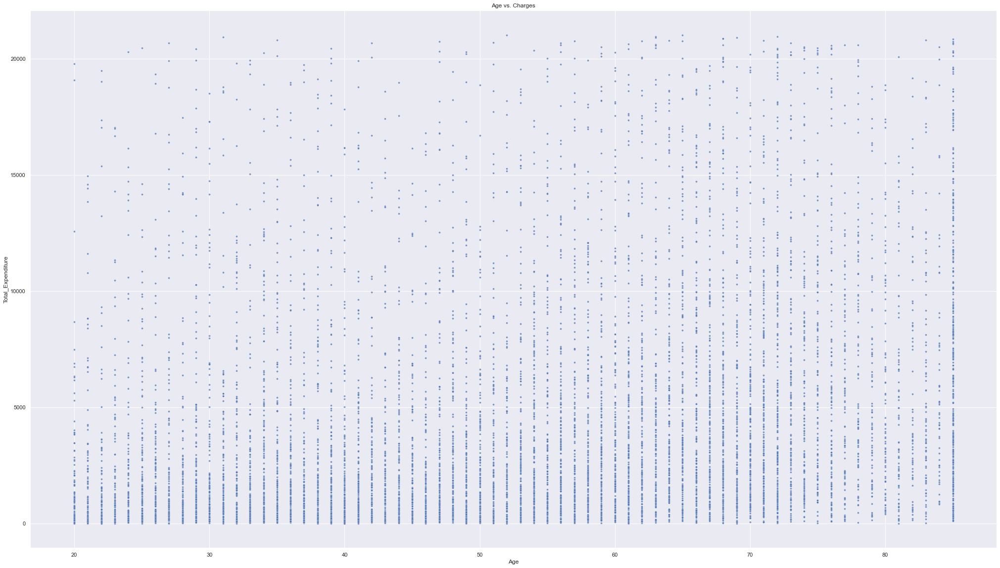

In [45]:
plt.title('Age vs. Charges')
sns.scatterplot(data=non_smoker_df, x='Age', y='Total_Expenditure', alpha=0.7, s=15);

Apart from a few exceptions, the points seem to form a line. 

In [46]:
model = LinearRegression()

In [47]:
#create X and Y data matrices
X = non_smoker_df.drop(columns=["Total_Expenditure", "Tobacco_Use"], axis=1)
y = non_smoker_df.Total_Expenditure
print('X.shape :', X.shape)
print('y.shape :', y.shape)


X.shape : (9903, 15)
y.shape : (9903,)


In [48]:
#Perform 80/20 split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [49]:
#Data dimention
X_train.shape, y_train.shape

((7922, 15), (7922,))

In [50]:
X_test.shape, y_test.shape

((1981, 15), (1981,))

In [51]:
from sklearn import linear_model
#Compute performance of the model
from sklearn.metrics import mean_squared_error, r2_score

In [52]:
#Build Linear regression
model = LinearRegression()

In [53]:
#build training model
model.fit(X_train, y_train)

LinearRegression()

In [54]:
#Apply trained model to make prediction (on test set)
y_pred = model.predict(X_test)

In [55]:
### Prediction results
print('Coefficients:', model.coef_)
print('Intercept:', model.intercept_)
print('Mean squared error (MSE): %.2f'
      % mean_squared_error(y_test, y_pred))
print('Coefficient of determination (R^2): %.2f'
      % r2_score(y_test, y_pred))

Coefficients: [-5.00313002e+00 -3.75750000e+00 -3.16880918e-01  6.28190108e+00
  3.27511542e-01 -3.28829571e+00  1.35599859e+00  1.82278133e+00
  2.43169670e-04  9.99708576e-01  9.98370109e-01  9.98852097e-01
  1.00087982e+00  1.00181494e+00  1.00391740e+00]
Intercept: 30.62735366981724
Mean squared error (MSE): 169346.32
Coefficient of determination (R^2): 0.99


In [56]:
#String Formatting
r2_score(y_test, y_pred)

0.9921238314746588

In [57]:
y_test

ID
2296414     6262
2327415     9110
2293093     1637
2295910       88
2326410    10872
           ...  
2324543     6551
2324440      555
2299344      653
2295951     1743
2293005     1585
Name: Total_Expenditure, Length: 1981, dtype: int64

In [58]:
np.array(y_test)

array([6262, 9110, 1637, ...,  653, 1743, 1585], dtype=int64)

In [59]:
y_pred

array([6317.07526131, 9147.8533301 , 1658.33037749, ...,  668.05522635,
       1764.64024317, 1598.52720845])

<AxesSubplot:xlabel='Total_Expenditure'>

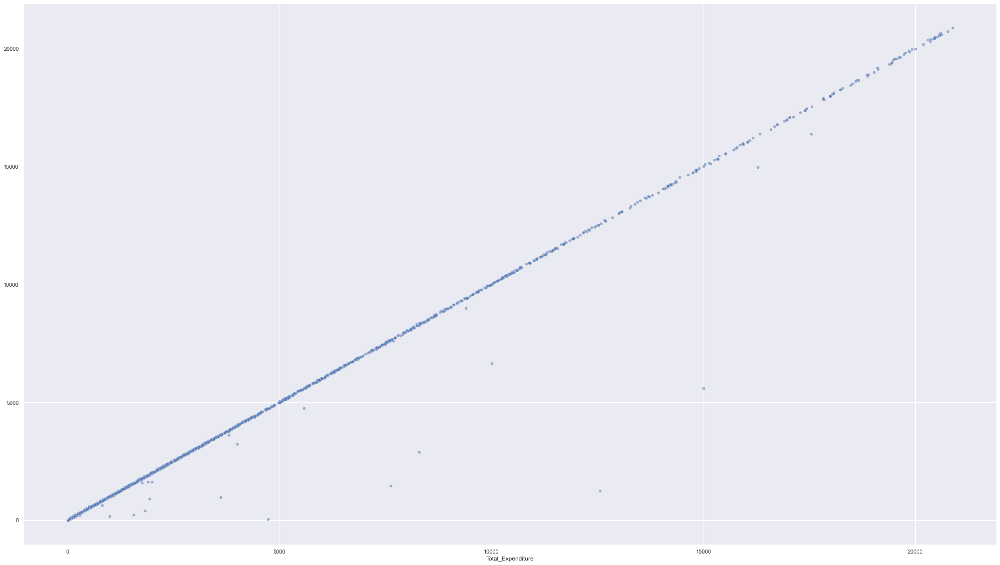

In [60]:
#Making the scatter plot
sns.scatterplot(y_test, y_pred, alpha=0.5)

In [61]:
#Testing prediction
data = {"age":20, "sex":1, "bmi":20, "children":5, "region": 2}
index=[0]
cust_df=pd.DataFrame(data, index)
cust_df

,age,sex,bmi,children,region
0,20,1,20,5,2


In [62]:
cost_prediction= model.predict(cust_df)
print("The medical insurance cost fo the new customer is: ", cost_prediction)

ValueError: X has 5 features, but LinearRegression is expecting 15 features as input.

## Comparing Three Machine Learning Model

In [63]:
# Preprocessing of data

In [64]:
from sklearn.preprocessing import LabelEncoder

In [65]:
#Data pre-processing
#encoding the categorical features
# sex 0 or 1
label = LabelEncoder()
label.fit(df_healthcare.Race.drop_duplicates())
df_healthcare.sex = label.transform(df_healthcare.Race)
# smoker or not
label.fit(df_healthcare.Tobacco_Use.drop_duplicates())
df_healthcare.smoker = label.transform(df_healthcare.Tobacco_Use)
#region, each region has a number
label.fit(df_healthcare.Region.drop_duplicates())
df_healthcare.Region = label.transform(df_healthcare.Region)

df_healthcare

,Family_Size,Region,Age,Sex,Race,Education_Level,Highest_Degree,BMI,Tobacco_Use,Total_Personal_Income,Total_Expenditure,Exp_Pocket,Exp_Medicare,Total_Medicaid,Exp_VA,Total_Priv_Tri,Total_Other
ID,,,,,,,,,,,,,,,,,
2290001,2,1,27,2,1,16,4,21.4,3,32000,2368,225,0,2037,0,107,0
2290001,2,1,25,1,1,17,4,30.6,3,0,2040,136,0,0,0,1904,0
2290002,6,1,34,2,1,10,3,28.2,3,25000,173,74,0,0,0,99,0
2290003,4,1,36,2,1,17,5,21.5,3,30217,535,232,0,0,0,303,0
2290005,5,1,30,1,1,14,3,28.3,3,31644,800,140,0,0,0,660,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2329682,4,3,32,1,1,16,4,23.7,3,69009,1939,1675,0,0,0,264,0
2329684,2,2,59,2,1,16,4,34.3,3,43670,2953,966,0,0,0,1987,0
2329684,2,2,66,1,1,16,4,31.0,2,8999,14660,9288,18,0,0,5354,0


In [66]:
import uuid

tempArr = []

for ind in df_healthcare.index:
    temp = uuid.uuid1()
    tempStr = str(temp)
    tempStr = tempStr.replace('-','')
    tempArr.append(tempStr)
 
df_healthcare['UUID'] = tempArr

In [67]:
df_healthcare.set_index('UUID',inplace=True)
df_healthcare.tail()

,Family_Size,Region,Age,Sex,Race,Education_Level,Highest_Degree,BMI,Tobacco_Use,Total_Personal_Income,Total_Expenditure,Exp_Pocket,Exp_Medicare,Total_Medicaid,Exp_VA,Total_Priv_Tri,Total_Other
UUID,,,,,,,,,,,,,,,,,
186b47a0e9b411ecbe3cf40228e5498f,4,3,32,1,1,16,4,23.7,3,69009,1939,1675,0,0,0,264,0
186b47a1e9b411ecaee2f40228e5498f,2,2,59,2,1,16,4,34.3,3,43670,2953,966,0,0,0,1987,0
186b47a2e9b411ec8e27f40228e5498f,2,2,66,1,1,16,4,31.0,2,8999,14660,9288,18,0,0,5354,0
186b47a3e9b411ecbc43f40228e5498f,3,3,33,2,1,16,4,29.2,3,18000,17820,2114,0,0,0,15706,0
186b47a4e9b411eca32af40228e5498f,3,3,32,1,1,13,3,27.3,3,47874,90,90,0,0,0,0,0


In [68]:
# Training Data, split the data into training and testing datasets by using train_test_split.

In [69]:
from sklearn.model_selection import train_test_split,cross_val_score

x=df_healthcare.drop(['Total_Expenditure'], axis='columns')
y=np.log(df_healthcare['Total_Expenditure'])

x_train, x_test, y_train, y_test=train_test_split(x,y,test_size=0.25, random_state=11)

x_train.shape, x_test.shape

((9063, 16), (3021, 16))

In [70]:
len(x_test), len(x_train), len(df_healthcare)

(3021, 9063, 12084)

In [71]:
# Train and Test the different kinds of Regression model

In [72]:
# Linear Regression - Model 1

In [73]:
from sklearn.model_selection import train_test_split as holdout
from sklearn.linear_model import LinearRegression
from sklearn import metrics

In [74]:
x = df_healthcare.drop(['Total_Expenditure'], axis = 1)
y = df_healthcare['Total_Expenditure']
x_train, x_test, y_train, y_test = holdout(x, y, test_size=0.2, random_state=0)
Lin_reg = LinearRegression()
Lin_reg.fit(x_train, y_train)
print(Lin_reg.intercept_)
print(Lin_reg.coef_)
print(Lin_reg.score(x_test, y_test))
print(Lin_reg.score(x_train, y_train))

82.43853824715552
[-5.55832332e-01 -9.42612949e-01 -5.44894396e-01 -4.19000864e+00
 -1.80279730e+00 -3.49657226e+00 -2.70521020e-01  1.20672398e+00
 -5.07891830e+00  2.53336368e-04  1.00139548e+00  9.98939864e-01
  9.98191043e-01  1.00062479e+00  1.00215552e+00  1.00170209e+00]
0.9951789497792826
0.9927605222683675


In [75]:
# Ridge Regression - Model 2

In [76]:
from sklearn.linear_model import Ridge
Ridge = Ridge(alpha=0.5)
Ridge.fit(x_train, y_train)
print(Ridge.intercept_)
print(Ridge.coef_)
print(Ridge.score(x_test, y_test))
print(Ridge.score(x_train, y_train))

82.43568219411645
[-5.55837149e-01 -9.42586868e-01 -5.44894815e-01 -4.18916741e+00
 -1.80278514e+00 -3.49655345e+00 -2.70571404e-01  1.20672354e+00
 -5.07838580e+00  2.53337437e-04  1.00139546e+00  9.98939861e-01
  9.98191047e-01  1.00062485e+00  1.00215551e+00  1.00170209e+00]
0.9951789499924549
0.9927605222683534


In [77]:
# Lasso Regression - Model 3

In [78]:
from sklearn.linear_model import Lasso
Lasso = Lasso(alpha=0.2, fit_intercept=True, normalize=False, precompute=False, max_iter=1000,
              tol=0.0001, warm_start=False, positive=False, random_state=None, selection='cyclic')
Lasso.fit(x_train, y_train)
print(Lasso.intercept_)
print(Lasso.coef_)
print(Lasso.score(x_test, y_test))
print(Lasso.score(x_train, y_train))

79.40062084734109
[-4.39706624e-01 -7.72894010e-01 -5.41152433e-01 -3.41462096e+00
 -1.77363866e+00 -3.50478185e+00 -2.04255616e-01  1.20319246e+00
 -4.72480967e+00  2.54097407e-04  1.00138508e+00  9.98939233e-01
  9.98196913e-01  1.00067795e+00  1.00214788e+00  1.00170706e+00]
0.9951793372404799
0.9927605092273154


In [79]:
# Train and fit to the model

In [80]:
def train_model(model):
    return model.fit(x_train, y_train)

models={'Linear Regression': Lin_reg,
        'Ridge Regression': Ridge,
        'Lasso Regression': Lasso}

for model in models.values():
    train_model(model)

In [81]:
for name, model in models.items():
    print(model,f'R2 score {model.score(x_test,y_test)}')

LinearRegression() R2 score 0.9951789497792826
Ridge(alpha=0.5) R2 score 0.9951789499924549
Lasso(alpha=0.2, normalize=False) R2 score 0.9951793372404799


In [82]:
for name, model in models.items():
    print(model,f'R2 score {model.score(x_train,y_train)}')

LinearRegression() R2 score 0.9927605222683675
Ridge(alpha=0.5) R2 score 0.9927605222683534
Lasso(alpha=0.2, normalize=False) R2 score 0.9927605092273154


In [83]:
# Cross Validation Evaluations 

In [84]:
cross_val_score(Lin_reg,x_test,y_test,cv=10).mean()

0.9951946905993004

In [87]:
cross_val_score(Ridge,x_test,y_test,cv=10).mean()

0.9951947071275393

In [88]:
cross_val_score(Lasso,x_test,y_test,cv=10).mean()

0.9951954092113985

In [89]:
# Using Evaluation Metrics, Mean Squared Error (MSE) model to assess accuracy of the model's predictions.

In [90]:
from sklearn.metrics import mean_squared_error

In [91]:
print(f'Train MSE {mean_squared_error(y_train,Lin_reg.predict(x_train))}')
print(f'Test MSE {mean_squared_error(y_test,Lin_reg.predict(x_test))}')
print(f'Train MSE {mean_squared_error(y_train,Ridge.predict(x_train))}')
print(f'Test MSE {mean_squared_error(y_test,Ridge.predict(x_test))}')
print(f'Train MSE {mean_squared_error(y_train,Lasso.predict(x_train))}')
print(f'Test MSE {mean_squared_error(y_test,Lasso.predict(x_test))}')

Train MSE 167623.53307435746
Test MSE 110722.38852877406
Train MSE 167623.53307468456
Test MSE 110722.3836329628
Train MSE 167623.83502807867
Test MSE 110713.48992218923


In [92]:
test=pd.DataFrame({'True values': np.exp(y_test),
                   'Linear Regression Predictions': np.exp(Lin_reg.predict(x_test)),
                   'Ridge Regression Predictions': np.exp(Ridge.predict(x_test)),
                   'Lasso Regression Predictions': np.exp(Lasso.predict(x_test))})

In [93]:
# Campare Linear Regression vs Ridge Regression vs Lasso Regression

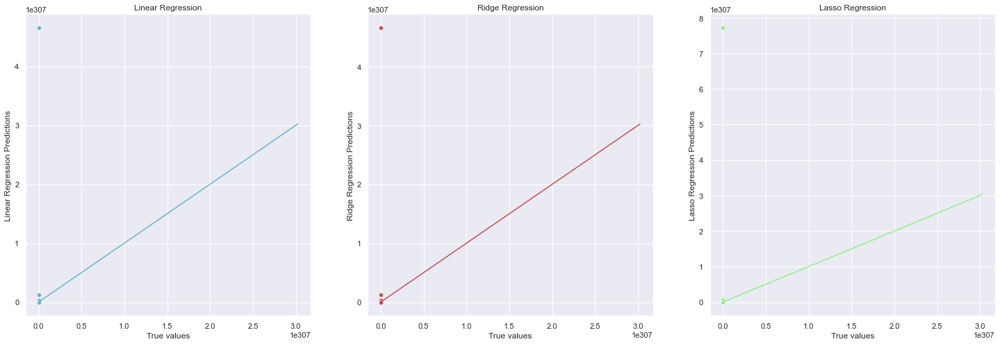

In [94]:
fig,(ax_1,ax_2,ax_3)=plt.subplots(1,3,figsize=(25,8))

ax_1.set_title("Linear Regression")
sns.scatterplot(x='True values',y='Linear Regression Predictions',data=test,ax=ax_1,color='c')
sns.lineplot(x='True values',y='True values',data=test,ax=ax_1,color='c')

ax_2.set_title('Ridge Regression')
sns.scatterplot(x='True values',y='Ridge Regression Predictions',data=test,ax=ax_2,color='r')
sns.lineplot(x='True values',y='True values',data=test,ax=ax_2,color='r')

ax_3.set_title('Lasso Regression')
sns.scatterplot(x='True values',y='Lasso Regression Predictions',data=test,ax=ax_3,color='lightgreen')
sns.lineplot(x='True values',y='True values',data=test,ax=ax_3,color='lightgreen')

plt.show()

In [95]:
test[:30]

,True values,Linear Regression Predictions,Ridge Regression Predictions,Lasso Regression Predictions
UUID,,,,
186a1003e9b411ecb10ff40228e5498f,inf,inf,inf,inf
186494f2e9b411ec9b2cf40228e5498f,inf,inf,inf,inf
1868fddce9b411ecb323f40228e5498f,inf,inf,inf,inf
1863ab74e9b411ecbc37f40228e5498f,inf,inf,inf,inf
185ad6aee9b411ec8691f40228e5498f,inf,inf,inf,inf
18692504e9b411eca353f40228e5498f,inf,inf,inf,inf
186a5d8ae9b411ecbb29f40228e5498f,inf,inf,inf,inf
185e2f96e9b411ecb6cff40228e5498f,9.597302e+247,1.142741e+260,1.142428e+260,1.076780e+260
186888dce9b411ec9a6bf40228e5498f,2.146436e+14,6.795071e+22,6.795218e+22,5.995777e+22


In [96]:
# Conclusion 
# After compared between three different regression method , we can see all three regression can predict very well and the accuracy is high.   
# After evaluating each Cross Validation Compared to Linear regression and lasso regression, we can see lasso regression score can provide very good predictions in general.

## Stacking Models

In [97]:
X = df_healthcare.drop("Total_Expenditure", axis=1)
X

,Family_Size,Region,Age,Sex,Race,Education_Level,Highest_Degree,BMI,Tobacco_Use,Total_Personal_Income,Exp_Pocket,Exp_Medicare,Total_Medicaid,Exp_VA,Total_Priv_Tri,Total_Other
UUID,,,,,,,,,,,,,,,,
185a3aafe9b411ecb952f40228e5498f,2,1,27,2,1,16,4,21.4,3,32000,225,0,2037,0,107,0
185a3ab0e9b411ec8e95f40228e5498f,2,1,25,1,1,17,4,30.6,3,0,136,0,0,0,1904,0
185a3ab1e9b411ec94aef40228e5498f,6,1,34,2,1,10,3,28.2,3,25000,74,0,0,0,99,0
185a3ab2e9b411ecb349f40228e5498f,4,1,36,2,1,17,5,21.5,3,30217,232,0,0,0,303,0
185a3ab3e9b411ec96a7f40228e5498f,5,1,30,1,1,14,3,28.3,3,31644,140,0,0,0,660,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
186b47a0e9b411ecbe3cf40228e5498f,4,3,32,1,1,16,4,23.7,3,69009,1675,0,0,0,264,0
186b47a1e9b411ecaee2f40228e5498f,2,2,59,2,1,16,4,34.3,3,43670,966,0,0,0,1987,0
186b47a2e9b411ec8e27f40228e5498f,2,2,66,1,1,16,4,31.0,2,8999,9288,18,0,0,5354,0


In [98]:
y = df_healthcare["Total_Expenditure"].copy()
y

UUID
185a3aafe9b411ecb952f40228e5498f     2368
185a3ab0e9b411ec8e95f40228e5498f     2040
185a3ab1e9b411ec94aef40228e5498f      173
185a3ab2e9b411ecb349f40228e5498f      535
185a3ab3e9b411ec96a7f40228e5498f      800
                                    ...  
186b47a0e9b411ecbe3cf40228e5498f     1939
186b47a1e9b411ecaee2f40228e5498f     2953
186b47a2e9b411ec8e27f40228e5498f    14660
186b47a3e9b411ecbc43f40228e5498f    17820
186b47a4e9b411eca32af40228e5498f       90
Name: Total_Expenditure, Length: 12084, dtype: int64

In [99]:
# Remove low variance features
from sklearn.feature_selection import VarianceThreshold

selection = VarianceThreshold(threshold=(0.1))    
X = selection.fit_transform(X)
X.shape

(12084, 16)

In [100]:
# Data splitting
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42
)

In [101]:
X_train.shape, X_test.shape

((9667, 16), (2417, 16))

In [102]:
#Build Classification models

In [103]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import f1_score

In [104]:
from sklearn.preprocessing import StandardScaler

In [105]:
from sklearn import preprocessing
from sklearn import utils

#convert y values to categorical values
lab = preprocessing.LabelEncoder()
y_transformed = lab.fit_transform(y)

#view transformed values
print(y_transformed)

[2076 1823  159 ... 6164 6530   77]


### K Nearest neighbors

In [106]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(5) # Define classifier
knn.fit(X_train, y_train) # Train model

# Make predictions
y_train_pred = knn.predict(X_train)
y_test_pred = knn.predict(X_test)

# Training set performance
knn_train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
knn_train_mcc = matthews_corrcoef(y_train, y_train_pred) # Calculate MCC
knn_train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
knn_test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
knn_test_mcc = matthews_corrcoef(y_test, y_test_pred) # Calculate MCC
knn_test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

print('Model performance for Training set')
print('- Accuracy: %s' % knn_train_accuracy)
print('- MCC: %s' % knn_train_mcc)
print('- F1 score: %s' % knn_train_f1)
print('----------------------------------')
print('Model performance for Test set')
print('- Accuracy: %s' % knn_test_accuracy)
print('- MCC: %s' % knn_test_mcc)
print('- F1 score: %s' % knn_test_f1)

Model performance for Training set
- Accuracy: 0.05348091445122582
- MCC: 0.053208658991011286
- F1 score: 0.029860315673619096
----------------------------------
Model performance for Test set
- Accuracy: 0.0
- MCC: -0.0002239109926107179
- F1 score: 0.0


### Random Forest

In [107]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100, random_state=0) # Define classifier
rf.fit(X_train, y_train) # Train model

# Make predictions
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

# Training set performance
rf_train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
rf_train_mcc = matthews_corrcoef(y_train, y_train_pred) # Calculate MCC
rf_train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
rf_test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
rf_test_mcc = matthews_corrcoef(y_test, y_test_pred) # Calculate MCC
rf_test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

print('Model performance for Training set')
print('- Accuracy: %s' % rf_train_accuracy)
print('- MCC: %s' % rf_train_mcc)
print('- F1 score: %s' % rf_train_f1)
print('----------------------------------')
print('Model performance for Test set')
print('- Accuracy: %s' % rf_test_accuracy)
print('- MCC: %s' % rf_test_mcc)
print('- F1 score: %s' % rf_test_f1)

Model performance for Training set
- Accuracy: 1.0
- MCC: 1.0
- F1 score: 1.0
----------------------------------
Model performance for Test set
- Accuracy: 0.008274720728175424
- MCC: 0.008080158249135258
- F1 score: 0.005358816296946747


### Neural network

In [108]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(alpha=1, max_iter=1000)
mlp.fit(X_train, y_train)

# Make predictions
y_train_pred = mlp.predict(X_train)
y_test_pred = mlp.predict(X_test)

# Training set performance
mlp_train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
mlp_train_mcc = matthews_corrcoef(y_train, y_train_pred) # Calculate MCC
mlp_train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
mlp_test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
mlp_test_mcc = matthews_corrcoef(y_test, y_test_pred) # Calculate MCC
mlp_test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

print('Model performance for Training set')
print('- Accuracy: %s' % mlp_train_accuracy)
print('- MCC: %s' % mlp_train_mcc)
print('- F1 score: %s' % mlp_train_f1)
print('----------------------------------')
print('Model performance for Test set')
print('- Accuracy: %s' % mlp_test_accuracy)
print('- MCC: %s' % mlp_test_mcc)
print('- F1 score: %s' % mlp_test_f1)

Model performance for Training set
- Accuracy: 0.338781421330299
- MCC: 0.33878425963597186
- F1 score: 0.29478467669660735
----------------------------------
Model performance for Test set
- Accuracy: 0.0008274720728175424
- MCC: 0.0006738183980439141
- F1 score: 0.000369854941638144


### Support vector machine (Radial basis function kernel)

In [ ]:
from sklearn.svm import SVC

svm_rbf = SVC(gamma=2, C=1)
svm_rbf.fit(X_train, y_train)

# Make predictions
y_train_pred = svm_rbf.predict(X_train)
y_test_pred = svm_rbf.predict(X_test)

# Training set performance
svm_rbf_train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
svm_rbf_train_mcc = matthews_corrcoef(y_train, y_train_pred) # Calculate MCC
svm_rbf_train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
svm_rbf_test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
svm_rbf_test_mcc = matthews_corrcoef(y_test, y_test_pred) # Calculate MCC
svm_rbf_test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

print('Model performance for Training set')
print('- Accuracy: %s' % svm_rbf_train_accuracy)
print('- MCC: %s' % svm_rbf_train_mcc)
print('- F1 score: %s' % svm_rbf_train_f1)
print('----------------------------------')
print('Model performance for Test set')
print('- Accuracy: %s' % svm_rbf_test_accuracy)
print('- MCC: %s' % svm_rbf_test_mcc)
print('- F1 score: %s' % svm_rbf_test_f1)

### Decision tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(max_depth=15) # Define classifier
dt.fit(X_train, y_train) # Train model

# Make predictions
y_train_pred = dt.predict(X_train)
y_test_pred = dt.predict(X_test)

# Training set performance
dt_train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
dt_train_mcc = matthews_corrcoef(y_train, y_train_pred) # Calculate MCC
dt_train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
dt_test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
dt_test_mcc = matthews_corrcoef(y_test, y_test_pred) # Calculate MCC
dt_test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

print('Model performance for Training set')
print('- Accuracy: %s' % dt_train_accuracy)
print('- MCC: %s' % dt_train_mcc)
print('- F1 score: %s' % dt_train_f1)
print('----------------------------------')
print('Model performance for Test set')
print('- Accuracy: %s' % dt_test_accuracy)
print('- MCC: %s' % dt_test_mcc)
print('- F1 score: %s' % dt_test_f1)

### Build Stacked model

In [ ]:
# Define estimators
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression

estimator_list = [
    ('knn',knn),
    ('svm_rbf',svm_rbf),
    ('dt',dt),
    ('rf',rf),
    ('mlp',mlp) ]

# Build stack model
stack_model = StackingClassifier(
    estimators=estimator_list, final_estimator=LogisticRegression()
)

# Train stacked model
stack_model.fit(X_train, y_train)

# Make predictions
y_train_pred = stack_model.predict(X_train)
y_test_pred = stack_model.predict(X_test)

# Training set model performance
stack_model_train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
stack_model_train_mcc = matthews_corrcoef(y_train, y_train_pred) # Calculate MCC
stack_model_train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set model performance
stack_model_test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
stack_model_test_mcc = matthews_corrcoef(y_test, y_test_pred) # Calculate MCC
stack_model_test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

print('Model performance for Training set')
print('- Accuracy: %s' % stack_model_train_accuracy)
print('- MCC: %s' % stack_model_train_mcc)
print('- F1 score: %s' % stack_model_train_f1)
print('----------------------------------')
print('Model performance for Test set')
print('- Accuracy: %s' % stack_model_test_accuracy)
print('- MCC: %s' % stack_model_test_mcc)
print('- F1 score: %s' % stack_model_test_f1)

### Results

In [ ]:
acc_train_list = {'knn':knn_train_accuracy,
'svm_rbf': svm_rbf_train_accuracy,
'dt': dt_train_accuracy,
'rf': rf_train_accuracy,
'mlp': mlp_train_accuracy,
'stack': stack_model_train_accuracy}

mcc_train_list = {'knn':knn_train_mcc,
'svm_rbf': svm_rbf_train_mcc,
'dt': dt_train_mcc,
'rf': rf_train_mcc,
'mlp': mlp_train_mcc,
'stack': stack_model_train_mcc}

f1_train_list = {'knn':knn_train_f1,
'svm_rbf': svm_rbf_train_f1,
'dt': dt_train_f1,
'rf': rf_train_f1,
'mlp': mlp_train_f1,
'stack': stack_model_train_f1}

In [ ]:
mcc_train_list

In [ ]:
acc_df = pd.DataFrame.from_dict(acc_train_list, orient='index', columns=['Accuracy'])
mcc_df = pd.DataFrame.from_dict(mcc_train_list, orient='index', columns=['MCC'])
f1_df = pd.DataFrame.from_dict(f1_train_list, orient='index', columns=['F1'])
df = pd.concat([acc_df, mcc_df, f1_df], axis=1)
df